# Рынок заведений общественного питания Москвы <a id='intro'></a>
### Введение
_____
**Описание исследования.**  

Исследование рынка Москвы, поиск особенностей, которые в будущем помогут в выборе подходящего инвесторам места.
_____
**Цель исследования.**
    
Презентация полученных результатов инвесторам.
    
_____
**Этапы исследования.**

1. [Ознакомление с данными и изучение общей информации](#step1)
2. [Предобработка](#step2)
3. [Анализ данных](#step3)
4. [Детализация исследования](#step4)
5. [Презентация](#step5)
_____
**Исходные данные.**

* Файл moscow_places.csv:
    1. name — название заведения;
    1. address — адрес заведения;
    1. category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    1. hours — информация о днях и часах работы;
    1. lat — широта географической точки, в которой находится заведение;
    1. lng — долгота географической точки, в которой находится заведение;
    1. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    1. price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    1. avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        + «Средний счёт: 1000–1500 ₽»;
        + «Цена чашки капучино: 130–220 ₽»;
        + «Цена бокала пива: 400–600 ₽».
    и так далее;
    1. middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        + Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    1. middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        + Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    1. chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым  
        1 — заведение является сетевым  
    1. district — административный район, в котором находится заведение, например Центральный административный округ;
    1. seats — количество посадочных мест.
        


### Шаг 1: Ознакомление с данными и изучение общей информации <a id='step1'></a>

In [1]:
#подгрузка необходимых библиотек

#работа с датафреймом
import pandas as pd
import numpy as np

#графика
from matplotlib import pyplot as plt
from plotly import graph_objects as go 
import plotly.express as px
import seaborn as sns

#геоаналитика и json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json
import sys
import platform

In [2]:
#загрузка таблицы, вывод основной информации
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')
pd.set_option('display.max_colwidth', None)
places.info()
places

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


#### Промежуточный вывод:
Данные получены. Видно, что в них имеются пропуски. В столбцах 'hours' и 'avg_bill' информация представлена в странном для анализа виде. 

### Шаг 2: Предобработка <a id='step2'></a>

* Задачи этапа:
    1. [Дубликаты в данных](#duples)
    1. [Обработка пропусков](#nans)
    1. [Cтолбец street](#street)
    1. [Столбец is_24/7](#is_24)

#### 1. Поиск дубликатов <a id='duples'></a>

Для начала посмотрим на полные дубликаты:

In [3]:
places[places.duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Их нет.  
Поищем более сложные:

In [4]:
places[places.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Заведений с одинаковым именем и адресом также не нашлось. А остальное, в общем, не криминал.  
Видимо, дубликатов нет.

#### 2. Обработка пропусков <a id='nans'></a>

Ещё раз взгрянем на основную информацию:

In [5]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Информации нехватает в нескольких столбцах. Пройдёмся по порядку:
1. hours - часы работы. 7870 из 8406. Пропусков не так много, можно удалить недостающие строки.
2. price - категория цен в заведении. Пропусков очень много. Категориальные данные средним значением не заполнить, оставим как есть.
3. avg_bill - средний счёт. Сейчас непонятно как заполнять. Возможно получится после категоризации.
4. middle_avg_bill и middle_avg_coffee - пропуски связаны с особенностями значений в других столбцах, как указано в документации. Не будем заполнять.
5. seats - кол-во посадочных мест. Пропусков много, как заполнять - не ясно. Оставим как есть.

In [6]:
#удалим пропуски в hours
places = places.dropna(subset=['hours']).reset_index()

#### 3. Столбец street <a id='street'></a>

Создадим столбец street с названиями улиц из столбца с адресом.  
Однако, не всегда это улица - порой проезд, порой переулок. 
Используем регулярное выражение.

In [7]:
pattern = ',*,(([а-яА-Я1-9-ё\s"]+)?(улица|парк|пруды|проезд|роща|переулок|шоссе|проспект|площадь|проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|)([а-яА-Яё1-9-\s"]+)?)'

places['street'] = places['address'].str.extract(pat = pattern)[0]

places[places['street'].isna()]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street


Отлично, пропусков в столбце улиц по результатам не осталось.

#### 4. Столбец is_24/7 <a id='is_24'></a>

* Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    1. True — если заведение работает ежедневно и круглосуточно;
    1. False — иначе.

In [8]:
places['is_24/7'] = places['hours'].str.contains('ежедневно, круглосуточно')

#посмотрим что получилось:
pd.pivot_table(places, index = 'is_24/7', values='name', aggfunc='count')

,name
is_24/7,
False,7140
True,730


#### Промежуточный вывод:
Дубликатов в данных не было.  
Строки с пропусками в часах работы было решено удалить, остальное решить на месте не получилось.  
Столбец street задан.  
Столбец is_24/7 задан. Круглосуточно и ежедневно работает лишь порядка 10 процентов заведений. 

### Шаг 3: Анализ данных <a id='step3'></a>

+ Задачи этапа:
    1. [Категории заведений](#cats)
    1. [Количество посадочных мест](#sits)
    1. [Сетевые места](#nets)
    1. [Категории и сетевые заведения](#catsit)
    1. [Топ-15 сетей](#top_15)
    1. [Административные районы](#districts)
    1. [Средние рейтинги](#avg_rating)
    1. [Хороплет и средние рейтинги](#hor_avg)
    1. [Кластеры заведений](#clusters)
    1. [Топ-15 улиц](#top_streets)
    1. [Улицы с одним объектом](#one_place)
    1. [Хороплет средних чеков](#hor_mid)
    1. [Общий вывод.](#int_concl)

#### Категории заведений <a id='#cats'></a>

Какие категории заведений представлены в данных?  
Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.  
Построим визуализации.

Для начала, просто сгруппируем данные и посмотрим на сводную таблицу:

In [9]:
category = pd.pivot_table(places, index = 'category', values='index', aggfunc='count').\
                sort_values(by='index', ascending=False).reset_index()
category

,category,index
0,кафе,2003
1,ресторан,1969
2,кофейня,1398
3,"бар,паб",747
4,пиццерия,628
5,быстрое питание,570
6,столовая,306
7,булочная,249


Хорошо. Мы видим, что есть 8 категорий заведений, большая часть которых это кафе, рестораны и кафейни.  
Чтобы нагляднее продемонстрировать соотношение, построим круговую и столбчатую диаграммы

In [10]:
fig = go.Figure(data=[go.Pie(labels=category['category'], values=category['index'])])
fig.update_layout(title='Число заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категории',
                                    showarrow=False)])
fig.show() 

In [11]:
fig = go.Figure([go.Bar(x=category['category'], y=category['index'])])
fig.update_layout(title='Количество заведений по категориям',
                   yaxis_title='Количество',
                   xaxis_title='Категории')
fig.show()

Теперь ясно, что кафе и рестораны составляют по четверти от общего числа заведений. Интересно, что сетей быстрого питания не так много. Возможно, это связано с тем, что многие рестораны быстрого питания попадают в категорию ресторанов, а не туда.

#### Количество посадочных мест <a id='sits'></a>

Исследуем количество посадочных мест в заведениях по категориям: рестораны, кофейни, пиццерии, бары и так далее

Как и раньше, для начала построим сводную таблицу.  


In [12]:
seats = pd.pivot_table(places, index = 'category', values='seats', aggfunc='median').\
                reset_index().sort_values(by='seats')
seats

,category,seats
1,булочная,50.0
5,пиццерия,55.0
3,кафе,60.0
2,быстрое питание,69.5
7,столовая,73.5
4,кофейня,80.0
0,"бар,паб",82.5
6,ресторан,86.0


Чтобы сравнить полученные значения, воспользуемся столбчатой диаграмой

In [13]:
fig = px.bar(seats, # загружаем данные и заново их сортируем
             y='category', # указываем столбец с данными для оси X
             x='seats' # указываем столбец с данными для оси Y
              # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Заведения по медианному количеству посадочных мест',
                   yaxis_title='Категории',
                   xaxis_title='Посадочные места')
fig.show() # выводим график

В ресторанах, барах и кофейнях в среднем более 80 посадочных мест  
В столовых и быстром питании - около 70  
В кафе и пиццериях - не более 60  
В булочных - 50

Также, посмотрим на боксплоты, чтобы увидеть разброс в различных категориях

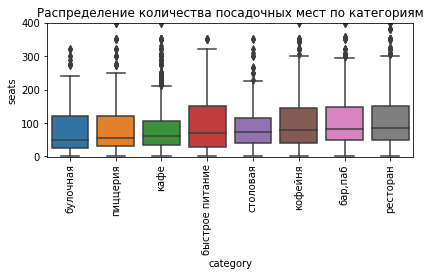

In [14]:
ax = sns.boxplot(x='category', y='seats', data=places, order = (places
                                                                .groupby('category')
                                                                .agg({'seats' : 'median'})
                                                                .sort_values(by='seats')
                                                                .index)) 
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.set(rc={'figure.figsize':(15,8)})
plt.title('Распределение количества посадочных мест по категориям')
plt.ylim([-1,400])
plt.tight_layout()
plt.show()

Видно, что среди заведений быстрого питания достаточно много мест с посадками, больше похожими на ресторанные. Фактически первый квартиль у нах совпадают. Это вновь косвенно свидетельствует о том, что часть данных находится не в своём столбце

#### Сетевые места <a id='nets'></a>

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [15]:
chain = pd.pivot_table(places, index = 'chain', values='index', aggfunc='count').\
                reset_index().sort_values(by='index')
chain['chain'] = ['Сетевые', 'Не сетевые']
chain

,chain,index
1,Сетевые,3089
0,Не сетевые,4781


Вновь построим круговую диаграмму для отображения результата

In [16]:
fig = go.Figure(data=[go.Pie(labels=chain['chain'], values=chain['index'])])
fig.update_layout(title='Соотношение сетевых заведений к несетевым', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Сеть',
                                    showarrow=False)])
fig.show() 

Не сетевых заведений больше, они составляют 60.7% датасета.

#### Категории и сетевые заведения <a id='catsit'></a>

Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.

Для начала, вновь составим сводную таблицу:

In [17]:
cat_chain = pd.pivot_table(places, index = 'category', values='chain', aggfunc='mean').\
                reset_index().sort_values(by='chain', ascending=False)
cat_chain['percent'] = cat_chain['chain'].apply(lambda x: f"{x:.2%}")
cat_chain

,category,chain,percent
1,булочная,0.618474,61.85%
5,пиццерия,0.525478,52.55%
4,кофейня,0.510730,51.07%
2,быстрое питание,0.392982,39.30%
6,ресторан,0.361605,36.16%
3,кафе,0.354968,35.50%
7,столовая,0.277778,27.78%
0,"бар,паб",0.212851,21.29%


Среди булочных сетевые заведения занимают более 60 процентов. Это удивительно и сильно отличается от основного объёма данных.  
Продемонстрируем полученные данные с помощью графика

In [18]:
fig = px.bar(cat_chain, # загружаем данные и заново их сортируем
             y='category', # указываем столбец с данными для оси X
             x='chain' # указываем столбец с данными для оси Y
              # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Категории по проценту сетевых мест',
                   yaxis_title='Категории',
                   xaxis_title='Процент сетевых мест')
fig.show() # выводим график

#### Топ-15 сетей <a id='top_15'></a>

Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве.  
Поймём, к какой категории они как правило относятся

In [19]:
top_15 = pd.pivot_table(places, index = ['name', 'category'], values=['index'], aggfunc='count').\
                sort_values(by='index', ascending=False)[:17].reset_index()
top_15

,name,category,index
0,Шоколадница,кофейня,119
1,Кафе,кафе,79
2,Домино'с Пицца,пиццерия,76
3,Додо Пицца,пиццерия,74
4,One Price Coffee,кофейня,71
5,Яндекс Лавка,ресторан,68
6,Cofix,кофейня,65
7,Prime,ресторан,49
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


Второе место, кафе "Кафе", не существует. (Я посмотрел в гугле, такой сети нет).  Скорее всего, это кафе без названия или малопопулярные, которым в столбец имени вписали категорию. Такая же ситуация с "Шаурмой". Удалим их из сводной таблицы чтобы не путаться

In [20]:
top_15.drop(labels = [1, 12],axis = 0, inplace=True)
top_15

,name,category,index
0,Шоколадница,кофейня,119
2,Домино'с Пицца,пиццерия,76
3,Додо Пицца,пиццерия,74
4,One Price Coffee,кофейня,71
5,Яндекс Лавка,ресторан,68
6,Cofix,кофейня,65
7,Prime,ресторан,49
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39
10,Теремок,ресторан,36


Чтобы отобразить полученные данные на графике, построим две круговые диаграммы  
В одной будет количество популярных сетей из топа, а вдругой - количество заведений каждой категории

In [21]:
#строим сводную таблицу по категориям
cat_top = pd.pivot_table(top_15, index = 'category', values=['index'], aggfunc=['count', 'sum']).\
                reset_index()
cat_top.columns = ['category', 'chain_amount', 'place_amount']
cat_top.sort_values(by='chain_amount', inplace=True)
cat_top

,category,chain_amount,place_amount
0,булочная,1,24
1,кафе,2,63
3,пиццерия,2,150
4,ресторан,3,153
2,кофейня,7,370


In [22]:
fig = go.Figure(data=[go.Pie(labels=cat_top['category'], values=cat_top['chain_amount'])])
fig.update_layout(title='Соотношение категорий в топовых сетях', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

In [23]:
fig = go.Figure(data=[go.Pie(labels=cat_top['category'], values=cat_top['place_amount'])])
fig.update_layout(title='Соотношение заведений в категориях в топовых сетях', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() 

Несмотря на то, что сетей-ресторанов в топе больше, чем сетей-пиццерий, количество заведений оказалось почти равным. Это связано с тем, что Домино'с Пицца и Додо Пицца занимают 2 и 3 места нашего топа. 

#### Административные районы <a id='districts'></a>

Отобразим общее количество заведений и количество заведений каждой категории по районам

Для начала составим сводную таблицу:

In [24]:
districts = pd.pivot_table(places, index = ['district', 'category'], values='index', aggfunc='count').\
                reset_index()
districts.columns = ['район', 'категория', 'кол-во']
districts['район'] = districts['район'].apply(lambda x: x[: x.find(' ')])
districts

,район,категория,кол-во
0,Восточный,"бар,паб",51
1,Восточный,булочная,23
2,Восточный,быстрое питание,66
3,Восточный,кафе,218
4,Восточный,кофейня,102
...,...,...,...
67,Южный,кафе,215
68,Южный,кофейня,130
69,Южный,пиццерия,73
70,Южный,ресторан,195


Здесь для каждого района посчитано количество заведений в каждой категории.  

Теперь отобразим данные на интерактивном графике:

In [25]:
fig = px.sunburst(districts, path=['район', 'категория'], values='кол-во')
fig.update_layout(title='Распределение заведений по районам Москвы', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600)
fig.show()

#### Средние рейтинги <a id='avg_rating'></a>

Визуализируем распределение средних рейтингов по категориям заведений. Для этого подойдёт график-виолончель:

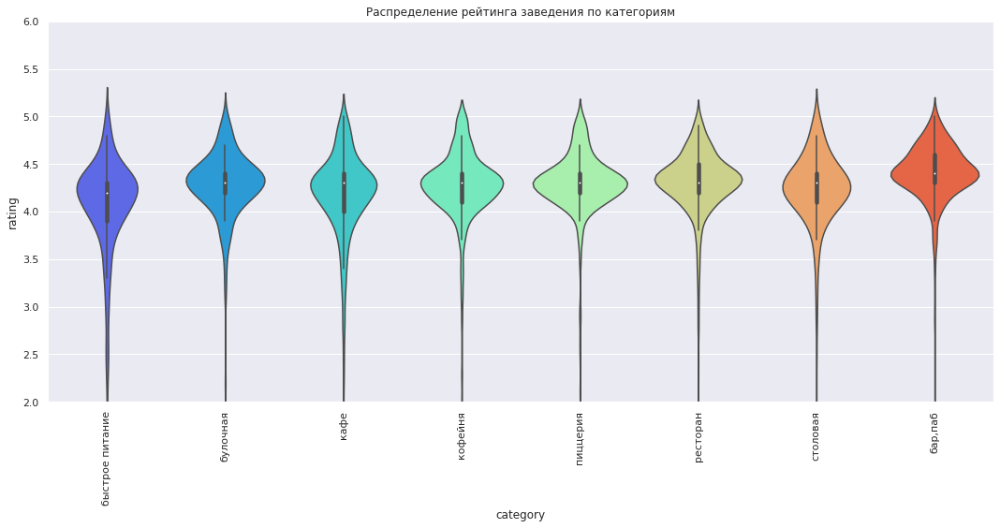

In [26]:
ax = sns.violinplot(x='category', y='rating', data=places, palette='rainbow', order = (places
                                                                .groupby('category')
                                                                .agg({'rating' : 'median'})
                                                                .sort_values(by='rating')
                                                                .index))
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.set(rc={'figure.figsize':(15,8)})
plt.title('Распределение рейтинга заведения по категориям')
plt.ylim([2,6])
plt.tight_layout()
plt.show()

#### Хороплет и средние рейтинги <a id='hor_avg'></a>

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [27]:
#составим сводную таблицу средних рейтингов
rating = places.groupby('district', as_index=False)['rating'].agg('median')
rating

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.4
6,Юго-Восточный административный округ,4.2
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


Нам нужен файл с границами районов Москвы. Найти его можно [здесь](https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson)

In [28]:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    errors="ignore",
    data=rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
    
).add_to(m)

# выводим карту
m

#### Кластеры заведений <a id='clusters'></a>

Отобразим все заведения датасета на карте с помощью кластеров

In [29]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m

#### Топ-15 улиц <a id='top_streets'></a>

Найдём топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам

Для начала найдём топ

In [30]:
top_streets = pd.pivot_table(places, index = 'street', values=['index'], aggfunc='count').\
                sort_values(by='index', ascending=False)[:15].reset_index()
top_streets

,street,index
0,проспект Мира,176
1,Профсоюзная улица,115
2,проспект Вернадского,101
3,Ленинский проспект,99
4,Ленинградский проспект,90
5,Дмитровское шоссе,86
6,Каширское шоссе,71
7,Варшавское шоссе,68
8,Ленинградское шоссе,67
9,Люблинская улица,56


Теперь для улиц из этого списка подготовим сводную таблицу с распределением заведений по категориям

In [31]:
streets = pd.pivot_table(places[places['street'].isin(top_streets['street'])],\
                         index = ['street', 'category'], values='index', aggfunc='count').\
                reset_index()
streets.columns = ['улица', 'категория', 'кол-во']
streets

,улица,категория,кол-во
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,12
3,Варшавское шоссе,кофейня,13
4,Варшавское шоссе,пиццерия,4
...,...,...,...
105,улица Миклухо-Маклая,быстрое питание,4
106,улица Миклухо-Маклая,кафе,18
107,улица Миклухо-Маклая,кофейня,4
108,улица Миклухо-Маклая,пиццерия,2


Для отображения результата подойдёт составная столбчатая диаграмма

In [32]:
fig = px.bar(streets, x="улица", y="кол-во", color="категория", title="Топ-15 улиц по количеству заведений")
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

#### Улицы с одним объектом <a id='one_place'></a>

Найдём улицы, на которых находится только один объект общепита

In [33]:
tail_streets = pd.pivot_table(places, index = 'street', values=['index'], aggfunc='count').\
                sort_values(by='index').reset_index()
tail_streets = tail_streets.query('index==1')
tail_streets

,street,index
0,1-й Автозаводский проезд,1
1,Угличская улица,1
2,Угрешская улица,1
3,Уссурийская улица,1
4,Дурасовский переулок,1
...,...,...
465,улица Кирпичные Выемки,1
466,Анненский проезд,1
467,улица Кондратюка,1
468,улица Капотня,1


Таких улиц довольно много. Посмотрим где они находятся на карте

In [34]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера 
places[places['street'].isin(tail_streets['street'])].apply(create_marker, axis=1)
    
# выводим карту
m

Улицы со всего одним заведением расположены по всей Москве. Посмотрим на распределение по категориям

In [35]:
tail_cats = pd.pivot_table(places[places['street'].isin(tail_streets['street'])], index = 'category', values=['index'], aggfunc='count').\
                sort_values(by='index', ascending=False).reset_index()
tail_cats

,category,index
0,кафе,150
1,ресторан,96
2,кофейня,91
3,"бар,паб",41
4,столовая,39
5,быстрое питание,28
6,пиццерия,15
7,булочная,10


Чаще всего это кафе, кофейни и рестораны. Можно посмотреть на график

In [36]:
fig = px.bar(tail_cats, x="category", y="index", title="Распределение по категориям на улицах с всего одним заведением")
fig.update_layout(barmode='stack', xaxis={'categoryorder':'total descending'})
fig.show()

#### Хороплет средних чеков <a id='#hor_mid'></a>

Посчитаем медианный средний чек для каждого района. Используем это значение в качестве ценового индикатора района и построим фоновую картограмму (хороплет) с полученными значениями для каждого района. 

In [37]:
bill = places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [38]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    errors="ignore",
    data=bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
    
).add_to(m)

# выводим карту
m

В Центральном и Западном административном округе средний чек составляет порядка 1000 рублей. В остальных - 500-700 рублей

#### Промежуточный вывод:<a id='int_concl'></a>

Кафе и рестораны составляют по четверти от общего числа заведений.  

В ресторанах, барах и кофейнях в среднем более 80 посадочных мест  
В столовых и быстром питании - около 70  
В кафе и пиццериях - не более 60  
В булочных - 50  

60.7% заведений не являются сетевыми.  
Среди кофеен, пиццерий и булочных более 50% заведений - сетевые.  
больше всего среди сетевых мест кофеен - 48.7%

Больше всего заведений в Центральном округе. Соответственно, там выше конкуренция, но выше и средний чек - 1000 рублей.  
Такой же средний чек в Западном округе.

В остальных округах средний чек колеблется от 500 до 700 рублей.


### Шаг 4: Детализация исследования <a id='step4'></a>

+ Заказчик указал, что кофейни - основная идея для открытия, и задал несколько вопросов конкретно о них:  

    1. [Количество и расположение](#coffee_amount)
    1. [Круглосуточные кофейни](#24_coffee)
    1. [Рейтинги кофеен](#coffee_ratings)
    1. [Стоимость чашки](#cup_price)
    1. [Рекомендации](#recoms)

#### Количество и расположение <a id='coffee_amount'></a>

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

Для начала узнаем, сколько всего кофеен в Москве

In [39]:
places[places['category']=='кофейня']['index'].count()

1398

Всего в Москве 1398 кофеен. Посмотрим на распределение по районам

In [40]:
coffee_districts = pd.pivot_table(places[places['category']=='кофейня'], index='district', values='index', aggfunc='count').\
                    reset_index().sort_values(by='index', ascending=False)
coffee_districts 

,district,index
5,Центральный административный округ,426
2,Северный административный округ,191
3,Северо-Восточный административный округ,157
1,Западный административный округ,148
8,Южный административный округ,130
0,Восточный административный округ,102
7,Юго-Западный административный округ,94
6,Юго-Восточный административный округ,88
4,Северо-Западный административный округ,62


Отобразим это с помощью графика

In [41]:
fig = go.Figure(data=[go.Pie(labels=coffee_districts['district'], values=coffee_districts['index'])])
fig.update_layout(title='Соотношение заведений по районам в категории Кофейни', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Округ',
                                    showarrow=False)])
fig.show() 

Сравним это с общим распределением заведений:

In [42]:
districts_pure = pd.pivot_table(places, index='district', values='index', aggfunc='count').\
                    reset_index().sort_values(by='index', ascending=False)
fig = go.Figure(data=[go.Pie(labels=districts_pure['district'], values=districts_pure['index'])])
fig.update_layout(title='Соотношение заведений по районам', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Округ',
                                    showarrow=False)])
fig.show() 

Можно заметить, что в Центральном и Северном окруе процент для кофеен больше, чем для всех заведений:  
30.5% против 28.1% и 13.7% против 10.7%. Отобразим сравнение более наглядно:

In [43]:
#создадим столбец с процентами в обеих таблицах
districts_pure['percent'] = districts_pure['index'].apply(lambda x: 100*x/sum(districts_pure['index']))
coffee_districts['percent'] = coffee_districts['index'].apply(lambda x: 100*x/sum(coffee_districts['index']))

#сделаем более читаемыми названия округов
districts_pure['district'] = districts_pure['district'].apply(lambda x: x[:x.find(' ')+1])
coffee_districts['district'] = coffee_districts['district'].apply(lambda x: x[:x.find(' ')+1])


fig = go.Figure()
fig.add_trace(go.Bar(
    x=districts_pure['district'],
    y=districts_pure['percent'],
    name='Общее распределение',
    marker_color='indianred'
))
fig.add_trace(go.Bar(
    x=coffee_districts['district'],
    y=coffee_districts['percent'],
    name='Распределение кофеен',
    marker_color='lightsalmon'
))

# Here we modify the tickangle of the xaxis, resulting in rotated labels.
fig.update_layout(barmode='group', xaxis_tickangle=-45, title_text='Распределение заведений по районам')
fig.show()

Наибольшее относительное различие в Северном АО в пользу кофеен и в Восточном, Юго-Западном и Юго-Восточном в пользу общего распределения, что может указывать на более низкую относительную конкуренцию в этом округе. В целом же распределение кофеен по округам почти совпадает с общим.

#### Круглосуточные кофейни <a id='24_coffee'></a>

Есть ли круглосуточные кофейни? Давайте посмотрим

In [44]:
places.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7870 entries, 0 to 7869
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   index              7870 non-null   int64  
 1   name               7870 non-null   object 
 2   category           7870 non-null   object 
 3   address            7870 non-null   object 
 4   district           7870 non-null   object 
 5   hours              7870 non-null   object 
 6   lat                7870 non-null   float64
 7   lng                7870 non-null   float64
 8   rating             7870 non-null   float64
 9   price              3310 non-null   object 
 10  avg_bill           3808 non-null   object 
 11  middle_avg_bill    3143 non-null   float64
 12  middle_coffee_cup  534 non-null    float64
 13  chain              7870 non-null   int64  
 14  seats              4495 non-null   float64
 15  street             7870 non-null   object 
 16  is_24/7            7870 

In [45]:
places[(places['category']=='кофейня') & (places['is_24/7']==True)]['index'].count()

59

Кофеен, которые работают ежедневно и круглосуточно, 59. Посмотрим, что с теми, которые работают круглосуточно хоть когда-нибудь:

In [46]:
places[(places['category']=='кофейня') & (places['hours'].str.contains('круглосуточно'))]['index'].count()

76

А таких 76! Посмотрим как они расположены на карте

In [47]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

places[(places['category']=='кофейня') & (places['hours'].str.contains('круглосуточно'))].apply(create_marker, axis=1)
    
# выводим карту
m

Большая часть круглосуточных кофеен расположена в центре и на западе Москвы. Логично, где-то там Москва никогда не спит.

#### Рейтинги кофеен <a id='coffee_ratings'></a>

Какие у кофеен рейтинги? Как они распределяются по районам?

Чтобы ответить на этот вопрос, лучше всего нарисовать ящики с усами:

In [48]:
#избавимся от длинных названий в округах
places_short = places.copy()
places_short['district'] = places_short['district'].apply(lambda x: x[:x.find(' ')+1])

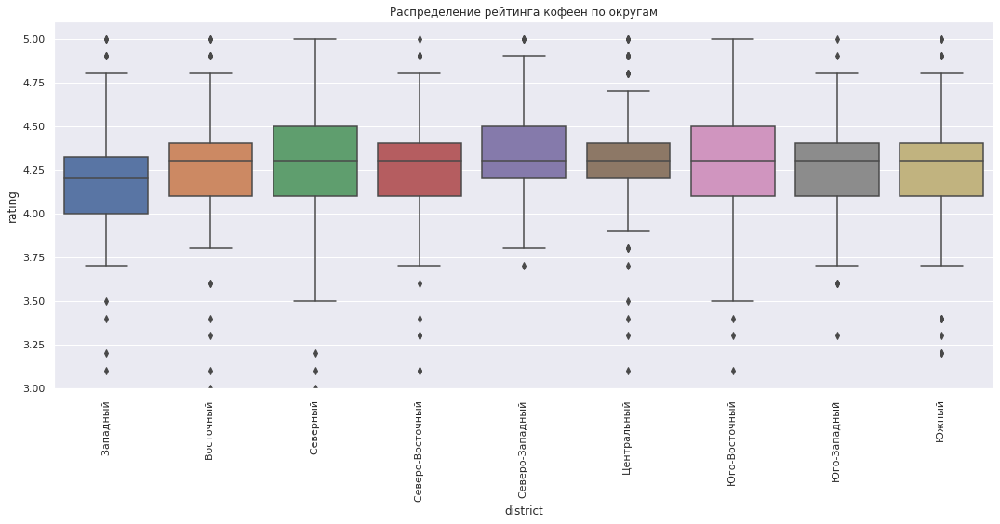

In [49]:
ax = sns.boxplot(x='district', y='rating', data=places_short[places_short['category']=='кофейня'], 
                                                                 order = (places_short[places_short['category']=='кофейня']
                                                                .groupby('district')
                                                                .agg({'rating' : 'median'})
                                                                .sort_values(by='rating')
                                                                .index)) 
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
sns.set(rc={'figure.figsize':(15,8)})
plt.title('Распределение рейтинга кофеен по округам')
plt.tight_layout()
plt.ylim(3, 5.1)
plt.show()

Средние рейтинги почти не отличаются от округа к округу и составляют примерно 4.3 за исключением Западного - там он заметно ниже остальных, на уровне 4.2

#### Стоимость чашки <a id='cup_price'></a>

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?  
Ответ на этот вопрос зависит от округа, в котором мы собрались открывать заведение. Взглянем на хороплет цены чашки:

In [50]:
mid_cup = pd.pivot_table(places[places['category']=='кофейня'], index='district', values='middle_coffee_cup', \
                        aggfunc='median').reset_index().sort_values(by='middle_coffee_cup', ascending=False)
mid_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [51]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    errors="ignore",
    data=mid_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная цена чашки по районам',
    
).add_to(m)

# выводим карту
m

Самая дорогая чашка в Юго-Западном АО. 198 рублей.

#### Рекомендации <a id='recoms'></a>

Основываясь на полученных данных, я бы рекомендовал открыть круглосуточную кофейню в Юго-Западном АО в районе метро Академическая.  

Имея самую высокую среднюю стоимость чашки (198р), заметна относительно низкая конкуренция кофеен (здесь 7% общего числа заведений, но лишь 6% кофеен)  
При этом, заметен небольшой кластер круглосуточных кофеен у пересечения Академической и Ленинского Проспекта.  
Насколько я помню (личный опыт), там довольно много ВУЗов и бизнес-центров, что должно обеспечить большую проходимость при правильном окончательном выборе места.

### Шаг 5: Презентация <a id='step5'></a>

Презентация: <https://docs.google.com/presentation/d/10BMfZkKX--ABoXPpUUH86S1areJ9TQgNusUv6pcFk1c/edit#slide=id.p>